In [143]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
import statistics
import operator
import json
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

In [2]:
def split_data(combined_df):
  replace = False#True  # with replacement
  fn = lambda obj: obj.loc[np.random.choice(obj.index, int(0.6*len(obj.index)), replace),:]
  train_data = combined_df.groupby('class', as_index=False, sort = False).apply(fn)
  train_data.index = train_data.index.droplevel()
  train_data = train_data.sample(frac = 1)
  test_val_data = combined_df.drop(train_data.index).sample(frac = 1)
  fn2 = lambda obj: obj.loc[np.random.choice(obj.index, int(0.5*len(obj.index)), replace),:]
  val_data = test_val_data.groupby('class', as_index=False, sort = False).apply(fn2)
  val_data.index = val_data.index.droplevel()
  val_data = val_data.sample(frac = 1)
  test_data = test_val_data.drop(val_data.index).sample(frac = 1)
  return train_data, val_data, test_data

# LS data read

In [3]:
def classwise_data(class1_data, class2_data, class3_data):
    
    class1 = pd.read_csv(class1_data,  ' ', header = None, names=['c1', 'c2'])
    class1['class'] = 1
    class2 = pd.read_csv(class2_data,  ' ', header = None, names=['c1', 'c2'])
    class2['class'] = 2
    class3 = pd.read_csv(class3_data,  ' ', header = None, names=['c1', 'c2'])
    class3['class'] = 3
    
    return class1, class2, class3

In [4]:
class1_data = '/content/Class1.txt'
class2_data = '/content/Class2.txt'
class3_data = '/content/Class3.txt'
class1, class2, class3 = classwise_data(class1_data, class2_data, class3_data)
combined_df = pd.concat([class1, class2, class3]).reset_index(drop=True)

<ipython-input-4-32dad8a02cfc>:4: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only
  class1, class2, class3 = classwise_data(class1_data, class2_data, class3_data)


In [5]:
train_data, val_data, test_data = split_data(combined_df)

In [6]:
train_data

,c1,c2,class
328,12.42000,-3.8251,1
37,12.40700,-5.6393,1
532,9.61530,1.8851,2
1003,-1.31670,-4.1336,3
69,16.76100,-8.2990,1
...,...,...,...
943,13.14100,5.7442,2
1499,-0.83124,-5.5745,3
1151,-2.08960,-6.5750,3
1046,1.48030,-8.1041,3


In [7]:
val_data

,c1,c2,class
329,15.723000,-5.6106,1
856,11.157000,5.4284,2
278,10.018000,-4.2045,1
1229,-1.230500,-2.0254,3
1008,0.216640,-3.0488,3
...,...,...,...
1067,0.282350,-3.1438,3
399,17.493000,-7.4749,1
277,12.087000,-4.8802,1
1454,0.062869,-6.3178,3


In [8]:
test_data

,c1,c2,class
867,8.44460,5.6099,2
1354,-0.87139,-5.3774,3
561,11.25700,3.7113,2
592,12.11300,7.6941,2
827,13.96300,7.6689,2
...,...,...,...
90,14.58900,-7.0607,1
1253,1.26050,-8.0341,3
956,14.61600,8.2922,2
225,14.21300,-5.8538,1


# Class FCNN

In [9]:
class FCNN():
  def __init__(self):
    return

  def init_hidden_layer(self, prev_layer_neurons, num_neurons):
    w = np.random.randn(prev_layer_neurons, num_neurons)
    return w

  def logistic_af(self, a):
    """
    a.shape = (num_neurons_layer, 1)
    activation_value: o/p array of shape= ()
    """
    activation_value = 1/(1+np.exp(-a))
    return activation_value

  def output_of_layer(self, weight_mtx, input_to_layer, activation=None):
    """
    weight_mtx: given by init_hidden_layer(). shape = (num_neurons_prev_layer, current_layer_neurons)
    input_to_layer = shape: (weight_mtx.shape[0],) where weight_mtx.shape[0] = num of neurons in prev layer
    """
    a = np.dot(weight_mtx.T, input_to_layer)
    h = self.logistic_af(a)
    return a, h

  def fcnn_arch(self, train_df, num_neurons_hidden, num_output_neurons):
    """
    train_df: is just train dataframe. needed only for getting i/p dim=d
    num_neurons_hidden = dictionary of {hidden_layer_num: number of neurons in it}. Ex: {1: 16, 2: 32}
    num_output_neurons: integer of num of output neurons. =1 for regression, 3 for classification
    """
    input_neurons = train_df.shape[1]-1#d
    num_hidden_layers = len(num_neurons_hidden.keys())
    layer_weights = {}
    w_h1 = self.init_hidden_layer(input_neurons+1, num_neurons_hidden[1])
    layer_weights[1] = w_h1
    for layer in range(2, num_hidden_layers+1):#second hidden layer onwards to all hidden layers. excluding o/p layer
      w = self.init_hidden_layer(num_neurons_hidden[layer-1]+1, num_neurons_hidden[layer])
      layer_weights[layer] = w
    w_o = self.init_hidden_layer(num_neurons_hidden[num_hidden_layers]+1, num_output_neurons)#output layer weights. o/p layer neurons will be = no. of classes of problem
    layer_weights[num_hidden_layers+1] = w_o
    return layer_weights

  def fcnn_forward(self, model_input, weights_dict):
    """
    model_input: one input sample: shape = (d+1,)
    """
    weighted_inputs = {}
    layer_outputs = {}
    layer_outputs[0] = model_input#used in delta_w computation. as input to hidden layer 1 is inp to model or o/p of inp layer 0
    a, output = self.output_of_layer(weights_dict[1], model_input)#output of layer h1
    weighted_inputs[1] = a
    output= np.hstack([np.ones((1)), output])
    layer_outputs[1] = output#has 1 appended in the beginning
    for hidden_layer in range(2,len(weights_dict.keys())):#bec dict keys can be in shuffled order
      a, output = self.output_of_layer(weights_dict[hidden_layer], output)
      weighted_inputs[hidden_layer] = a
      output= np.hstack([np.ones((1)), output])
      layer_outputs[hidden_layer] = output
    a, model_output = self.output_of_layer(weights_dict[len(weights_dict.keys())], output)
    weighted_inputs[len(weights_dict.keys())] = a
    layer_outputs[len(weights_dict.keys())] = model_output
    return weighted_inputs, layer_outputs

  def instantaneous_error(self, y_n, y_pred):
    """
    y_n: actual shape = (K=3,)
    y_pred: predicted: output of perceptron_forward fn. shape = (K=3,)
    """
    # error = 0.5*((y_n - y_pred)**2)
    err = y_n - y_pred
    error = 0.5*np.dot(err.T, err)
    return error

  def logistic_af_derivative(self, a):
    derivative = self.logistic_af(a)* (1-self.logistic_af(a))
    return derivative

  def del_op(self, a_o, y_n, y_pred):
    """
    a_o: weighted sum input to output layer.(activation not applied yet) shape = (K,). first o/p of output_of_layer
    """
    err = y_n - y_pred
    del_o = err* self.logistic_af_derivative(a_o)
    return del_o

  def del_hidden(self, del_next_layer, w_nxt_layer, a_current_layer):#del of h_n-1, i.e. pre-final layer
    """
    del_next_layer shape = (num_neurons_nxt_layer, )
    w_nxt_layer shape = (num_neurons_current_layer+1, num_neurons_nxt_layer)
    a_current_layer = dim = (num_neurons_current_layer,) it is weighted sum of inputs to current layer. will fetch from weighted_inputs
    o/p of fcnn_forward
    """
    w_effective= w_nxt_layer[1:,:]#without bias
    first_term = np.dot(w_effective, del_next_layer)
    second_term = self.logistic_af(a_current_layer)#a_current_layer = output_of_layer(weight_mtx, input_to_layer=rawo/p of prev layer
    del_h = first_term*second_term
    return del_h

  def delta_layer(self, lr, del_layer, op_previous_layer):
    """
    op_previous_layer: raw input to the layer whose delta we're computing. shape = (num_neurons_previous_layer, 1)
    del_layer = del of the concerned layer. shape = (num_neurons_current_layer, 1)
    """
    # op_previous_layer = np.hstack([np.ones((1)), op_previous_layer])
    tmp_mtx = np.dot(op_previous_layer.reshape(-1,1), del_layer.reshape(1,-1))
    # print(tmp_mtx.shape)
    # delta_w = lr*op_previous_layer*del_layer
    delta_w = lr*tmp_mtx
    return delta_w

  def compute_gradients(self, layer_weights, weighted_inputs, layer_outputs, y_n, lr):
    del_layers_dict = {}
    num_layers = len(layer_weights.keys())
    del_output_layer = self.del_op(weighted_inputs[num_layers], y_n, layer_outputs[num_layers])
    del_layers_dict[num_layers] = del_output_layer
    delta_dict = {}
    delta_dict[num_layers] = self.delta_layer(lr, del_output_layer, layer_outputs[num_layers-1])
    updated_w = layer_weights.copy()

    # layer_weights[num_layers] = layer_weights[num_layers] + delta_dict[num_layers]- doubt: updated weights used in each layer del?

    for hidden_layer in reversed(range(1, num_layers)):#2,1
      # print(hidden_layer)
      del_next = del_layers_dict[hidden_layer+1]
      del_layers_dict[hidden_layer] = self.del_hidden(del_next, layer_weights[hidden_layer+1], weighted_inputs[hidden_layer])
      delta_dict[hidden_layer] = self.delta_layer(lr, del_layers_dict[hidden_layer], layer_outputs[hidden_layer-1])
    return delta_dict

  def train_fcnn_clf(self, train_data, lr, max_epochs, num_output_neurons, num_neurons= {1: 3, 2:5}):
    """
    num_neurons = dictionary for hidden layer : {hidden_layer_num: number of neurons in it}. Ex: {1: 16, 2: 32}
    num_output_neurons = integer of num of output neurons. =1 for regression, 3 for classification
    """
    N = train_data.shape[0]
    y_arr = train_data['class'].values
    #converting y_arr integer class value into one-hot numpy array of shape (3,1)
    labels = np.zeros((y_arr.size, y_arr.max()))  # initialize empty (all zero) label array
    labels[np.arange(y_arr.size), y_arr-1] = 1  # add ones in indices where we have a value
    # labels is one hot 2d numpy array
    weights_dict = self.fcnn_arch(train_data, num_neurons, 3)#random weights initialization
    epoch = 0
    average_error = []
    # average_error = [100]
    # error_diff = 100
    # while np.abs(error_diff)>=0.001:#change convergence criteria to threshold
    while epoch<max_epochs:
      # print(epoch)
      epoch_total_error = 0# current epoch's avg error
      for count, row_index in enumerate(train_data.index):#iterating over all samples. improvement scope: data shuffle each epoch
        x_n = train_data.loc[row_index,:].to_numpy()[:-1]
        x_n = np.hstack([np.ones((1)), x_n])#shape = (3,)
        y_n = labels[count, :]#shape = (3,)
        # print(labels)
        # print(y_n)
        weighted_inputs, layer_outputs = self.fcnn_forward(x_n, weights_dict)#forward function
        num_layers = len(weights_dict.keys())
        y_pred = layer_outputs[num_layers]
        # backpropagation gradient computation
        instant_error = self.instantaneous_error(y_n, y_pred)
        epoch_total_error = epoch_total_error+instant_error
        delta_w_dict = self.compute_gradients(weights_dict, weighted_inputs, layer_outputs, y_n, lr)
        #weights update
        for layer in weights_dict.keys():
          weights_dict[layer] = weights_dict[layer]+delta_w_dict[layer]
      average_error.append(epoch_total_error/N)
      epoch = epoch+1
      # error_diff = average_error[epoch]- average_error[epoch-1]
    return average_error, weights_dict

  def test_clf(self, test_data, weights_dict):
    N = test_data.shape[0]
    y_arr = test_data['class'].values#shape= (300,)
    y_pred = []
    for count, row_index in enumerate(test_data.index):#iterating over all samples. improvement scope: data shuffle each epoch
      x_n = test_data.loc[row_index,:].to_numpy()[:-1]
      x_n = np.hstack([np.ones((1)), x_n])#shape = (3,)
      weighted_inputs, layer_outputs = self.fcnn_forward(x_n, weights_dict)#forward function
      num_layers = len(weights_dict.keys())
      y_hat = layer_outputs[num_layers]
      # print(y_hat)
      y_hat = y_hat.argmax()+1
      y_pred.append(y_hat)
    cm = confusion_matrix(y_arr,y_pred)
    # print(cm)
    # print(accuracy_score(y_arr, y_pred))
    # return cm
    return cm, accuracy_score(y_arr, y_pred)*100

#Cross validation functions

In [200]:
def cross_validation_clf(layer_neurons_dict, val_data, max_epochs = 900):
  skf = StratifiedKFold(n_splits=2, shuffle=False)

  X = val_data.iloc[:, :-1]
  Y = val_data.iloc[:, -1]
  accuracy_lst = []
  for i, (train_index, test_index) in enumerate(skf.split(X, Y)):
    # print(f"Fold {i}:")
    tr_df = val_data.loc[val_data.index[train_index]]
    tst_df = val_data.loc[val_data.index[test_index]]
    model = FCNN()
    ls_average_error, ls_weights_dict = model.train_fcnn_clf(tr_df, 0.01, max_epochs, 3, layer_neurons_dict)
    cm, accuracy = model.test_clf(tst_df, ls_weights_dict)
    accuracy_lst.append(accuracy)
    # print(accuracy)
  mean_accuracy = statistics.mean(accuracy_lst)
  # print(mean_accuracy)
  return mean_accuracy

In [201]:
def validate_all_archs(val_data, lst = [4, 8, 16, 32, 50, 64, 128], max_epochs = 900):
  """
  for more than one hidden layer arch
  """
  # lst = [4, 8, 16, 32, 50, 64, 128]
  arch_wise_val_accuracy = {}
  arch_dict = {}# will contain all architectures' dimensions 
  for i in range(len(lst)):#for each combination of neurons
    if i<len(lst):
      layer_neurons_dict = {}
      layer_neurons_dict[1] = lst[i]#lst[i]
      layer_neurons_dict[2] = lst[i]#lst[i+1]
      arch_dict[i] = layer_neurons_dict
      print(layer_neurons_dict)
      accuracy_of_arch = cross_validation_clf(layer_neurons_dict, val_data, max_epochs)
      arch_wise_val_accuracy[i] = accuracy_of_arch

  return arch_wise_val_accuracy, arch_dict

In [202]:
def get_final_val_metrics(train_data, val_data, test_data, lst ,max_epochs=900):
  """
  for more than one hidden layer arch
  """
  arch_wise_val_accuracy, arch_dict = validate_all_archs(val_data, lst)
  best_idx =max(arch_wise_val_accuracy.items(), key=operator.itemgetter(1))[0]

  best_arch_weights = {}
  validation_cms = {}
  validation_accuracies = {}
  for i in range(len(arch_dict.keys())):
    print(i)
    # layer_
    model_ = FCNN() 
    average_error, weights_dict = model_.train_fcnn_clf(train_data, 0.01, max_epochs, 3, arch_dict[i])
    val_conf_mtx, val_accuracy = model_.test_clf(val_data, weights_dict)
    validation_cms[i] = val_conf_mtx
    validation_accuracies[i] = val_accuracy
    if i==best_idx:
      best_arch_test_conf_mtx, best_arch_test_accuracy = model_.test_clf(test_data, weights_dict)
      best_arch_weights = weights_dict
  return validation_cms, validation_accuracies, best_arch_weights, best_arch_test_conf_mtx, best_arch_test_accuracy

In [203]:
def validate_single_layer_archs(val_data, lst = [4, 6, 8, 16], max_epochs = 900):
  """
  for single layer arch
  """
  # lst = [4, 8, 16, 32, 50, 64, 128]
  arch_wise_val_accuracy = {}
  arch_dict = {}# will contain all architectures' dimensions 
  for i in range(len(lst)):#for each combination of neurons
      layer_neurons_dict = {}
      layer_neurons_dict[1] = lst[i]#lst[i+1]
      arch_dict[i] = layer_neurons_dict
      accuracy_of_arch = cross_validation_clf(layer_neurons_dict, val_data, max_epochs)
      arch_wise_val_accuracy[i] = accuracy_of_arch

  return arch_wise_val_accuracy, arch_dict

In [204]:
def get_final_val_metrics_single(train_data, val_data, test_data, lst= [4, 6, 8, 16], max_epochs= 900):
  """
  for single layer arch
  """
  arch_wise_val_accuracy, arch_dict = validate_single_layer_archs(val_data, lst)#arch_wise_val_accuracy = cross validation accuracy
  best_idx =max(arch_wise_val_accuracy.items(), key=operator.itemgetter(1))[0]

  best_arch_weights = {}
  validation_cms = {}
  validation_accuracies = {}
  for i in range(len(arch_dict.keys())):
    # print(i)
    # layer_
    model_ = FCNN() 
    average_error, weights_dict = model_.train_fcnn_clf(train_data, 0.01, max_epochs, 3, arch_dict[i])
    val_conf_mtx, val_accuracy = model_.test_clf(val_data, weights_dict)
    validation_cms[i] = val_conf_mtx
    validation_accuracies[i] = val_accuracy
    if i==best_idx:
      best_arch_test_conf_mtx, best_arch_test_accuracy = model_.test_clf(test_data, weights_dict)
      best_arch_weights = weights_dict
  return validation_cms, validation_accuracies, best_arch_weights, best_arch_test_conf_mtx, best_arch_test_accuracy

#LS cross validation

In [ ]:
validation_cms, validation_accuracies, best_arch_weights, best_arch_test_conf_mtx, best_arch_test_accuracy = get_final_val_metrics_single(train_data, val_data, test_data, [4, 6, 8, 16], 900)

In [ ]:
print(validation_cms)

In [ ]:
print(best_arch_test_conf_mtx)

#NLS cross validation

In [ ]:
nls_validation_cms, nls_validation_accuracies, nls_best_arch_weights, nls_best_arch_test_conf_mtx, nls_best_arch_test_accuracy = get_final_val_metrics(nls_train_data, nls_val_data, nls_test_data, [4, 6, 8, 16], 900)

In [ ]:
print(nls_validation_cms)

In [ ]:
print(nls_best_arch_test_conf_mtx)

#LS best arch training

In [15]:
model = FCNN()
layer_neurons_dict = {1: 8}

ls_average_error, ls_weights_dict = model.train_fcnn_clf(train_data, 0.01, 1000, 3, layer_neurons_dict)

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [16]:
cm, accuracy = model.test_clf(train_data, ls_weights_dict)

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [17]:
cm_val, accuracy_val = model.test_clf(val_data, ls_weights_dict)

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [18]:
cm_test, accuracy_test = model.test_clf(test_data, ls_weights_dict)

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [22]:
cm

array([[292,   7,   1],
       [  0, 300,   0],
       [  0,   0, 300]])

In [20]:
cm_test

array([[ 93,   7,   0],
       [  0, 100,   0],
       [  0,   0, 100]])

In [24]:
ls_average_error2, ls_weights_dict2 = model.train_fcnn_clf(train_data, 0.09, 1000, 3, {1:10})

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [25]:
cm, accuracy = model.test_clf(train_data, ls_weights_dict2)
cm

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


array([[297,   3,   0],
       [  0, 300,   0],
       [  0,   0, 300]])

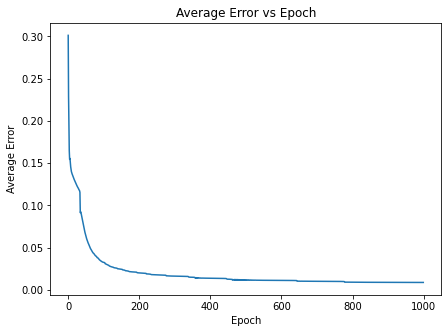

In [19]:
plt.figure(figsize=(7,5))
plt.plot(list(range(len(ls_average_error))), ls_average_error)
plt.title("Average Error vs Epoch")
plt.xlabel("Epoch")
plt.ylabel("Average Error")
plt.savefig("/content/LS_errorvsepoch.jpg")
plt.show()

#LS best arch decision plot

In [26]:
def get_plot_coords(weights_dict, all_points, cmap='Paired_r'):
  h = 0.02
  num_layers = len(weights_dict.keys())

  x_n = all_points.to_numpy()
  print(x_n.shape)
  x_n = np.hstack([np.ones((x_n.shape[0], 1)), x_n])
  n = x_n.shape[0]
  print(x_n)
  z = []
  # c1, c2, c3 = [], [], []#coords of 3 classes
  for i in range(n):
    # print(x_n[i])
    mod = FCNN()
    weighted_inputs, layer_outputs = mod.fcnn_forward(x_n[i], weights_dict)
    zz = layer_outputs[num_layers]
    zz = zz.argmax()+1
    z.append(zz)
  z = np.array(z)
  # z = z.reshape(xx.shape)
  return z

In [31]:
h = 0.02
# h = 0.08
min_x_val, max_x_val = train_data.iloc[:,0].min() - 10*h, train_data.iloc[:,0].max() + 10*h
min_y_val, max_y_val = train_data.iloc[:,1].min() - 10*h, train_data.iloc[:,1].max() + 10*h

all_points = []
for i in range(int(min_x_val-5), int(max_x_val+5)):
    for j in range(int(min_y_val-5), int(max_y_val+5)):
        all_points.append([i, j])
        

all_points = pd.DataFrame(all_points)
output = get_plot_coords(ls_weights_dict, all_points)

(1360, 2)
[[  1. -10. -17.]
 [  1. -10. -16.]
 [  1. -10. -15.]
 ...
 [  1.  29.  14.]
 [  1.  29.  15.]
 [  1.  29.  16.]]


<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


<Figure size 576x360 with 0 Axes>

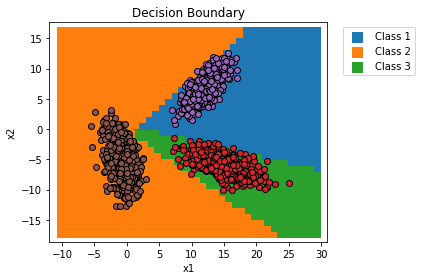

In [44]:


c1x, c2x, c3x = [], [], []
c1y, c2y, c3y = [], [], []

y = output

for i in range(len(all_points)):
        
    if y[i] == 1:
        c1x.append(all_points.iloc[i, 0])
        c1y.append(all_points.iloc[i, 1])
    elif y[i] == 2:
        c2x.append(all_points.iloc[i, 0])
        c2y.append(all_points.iloc[i, 1])
    else:
        c3x.append(all_points.iloc[i, 0])
        c3y.append(all_points.iloc[i, 1])

plt.figure(figsize=(8,5))    

fig, ax = plt.subplots()

# plt.scatter(c2x, c2y, marker='x', s=100)
# plt.scatter(c3x, c3y, marker='x', s=100)
# plt.scatter(c1x, c1y, marker='x', s=100)

plt.scatter(c2x, c2y, marker='s', s=100)
plt.scatter(c3x, c3y, marker='s', s=100)
plt.scatter(c1x, c1y, marker='s', s=100)


plt.legend(['Class 2','Class 3', 'Class 1'])
plt.legend(['Class 1','Class 2', 'Class 3'], bbox_to_anchor=(1.04,1), loc="upper left")

plt.title("Decision Boundary")
# plt.xlabel("x1")
# plt.ylabel('x2')
ax.set_xlabel("x1")

ax.set_ylabel("x2")

# ax.set_zlabel("Neuron Activation")

plt.scatter(class1['c1'], class1['c2'], edgecolors='black')
plt.scatter(class2['c1'], class2['c2'], edgecolors='black')
plt.scatter(class3['c1'], class3['c2'], edgecolors='black')

plt.tight_layout()
plt.savefig("/content/ls_decisionboundary.jpg")
# plt.savefig("/Users/rajeshr/Desktop/fcnndecisionboundary.png")
# plt.xlim(-12, 30)
# plt.ylim(-20, 12)

plt.show()

In [ ]:
# b1x, b1y = [i[0] for i in c1], [i[1] for i in c1]
# b2x, b2y = [i[0] for i in c2], [i[1] for i in c2]
# b3x, b3y = [i[0] for i in c3], [i[1] for i in c3]

# plt.figure(figsize=(6,5))
# plt.scatter(b1x, b1y, marker='s', s=10)
# plt.scatter(b2x, b2y, marker='s', s=10)
# plt.scatter(b3x, b3y, marker='s', s=10)


# plt.scatter(class1['c1'], class1['c2'], edgecolors='black')
# plt.scatter(class2['c1'], class2['c2'], edgecolors='black')
# plt.scatter(class3['c1'], class3['c2'], edgecolors='black')
# plt.legend(['Class 1','Class 2','Class 3'])
# plt.title("Combined Decision Boundary")
# # plt.xlim(-15, 30)
# # plt.ylim(-5, 25)
# # plt.xlim(-12, 20)
# # plt.ylim(-20, 12)
# plt.savefig("/content/ls_decisionboundary.jpg")

#LS neuron plots

#NLS data read

In [45]:
nls_data_path = '/content/NLS_Group07.txt'
nls_data = pd.read_csv(nls_data_path, ' ', header = None, names=['c1', 'c2'], skiprows=1, index_col = False, usecols=None)
nls_data["class"] = 1
nls_data.loc[500:1000, 'class'] = 2
nls_data.loc[1000:, 'class'] = 3
nls_train_data, nls_val_data, nls_test_data = split_data(nls_data)

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: FutureWarning: In a future version of pandas all arguments of read_csv except for the argument 'filepath_or_buffer' will be keyword-only
  exec(code_obj, self.user_global_ns, self.user_ns)


In [46]:
nls_class1 = nls_train_data[nls_train_data.loc[:, 'class']==1]
nls_class2 = nls_train_data[nls_train_data.loc[:, 'class']==2]
nls_class3 = nls_train_data[nls_train_data.loc[:, 'class']==3]

In [47]:
nls_class1_val = nls_val_data[nls_val_data.loc[:, 'class']==1]
nls_class2_val = nls_val_data[nls_val_data.loc[:, 'class']==2]
nls_class3_val = nls_val_data[nls_val_data.loc[:, 'class']==3]

In [48]:
nls_class1_test = nls_test_data[nls_test_data.loc[:, 'class']==1]
nls_class2_test = nls_test_data[nls_test_data.loc[:, 'class']==2]
nls_class3_test = nls_test_data[nls_test_data.loc[:, 'class']==3]

#NLS best arch training

In [63]:
model = FCNN()
layer_neurons_dict = {1: 64, 2:64}

nls_average_error, nls_weights_dict = model.train_fcnn_clf(nls_train_data, 0.09, 900, 3, layer_neurons_dict)

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [64]:
cm, accuracy = model.test_clf(nls_train_data, nls_weights_dict)
cm

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


array([[300,   0,   0],
       [  0, 300,   0],
       [  1,   0, 599]])

In [65]:
cm, accuracy = model.test_clf(nls_test_data, nls_weights_dict)
cm

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


array([[100,   0,   0],
       [  0, 100,   0],
       [  2,   0, 198]])

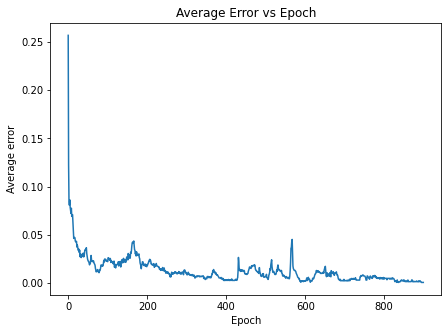

In [74]:
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot()
plt.plot(list(range(len(nls_average_error))), nls_average_error)
plt.title("Average Error vs Epoch")
ax.set_xlabel('Epoch')
ax.set_ylabel('Average error')

plt.savefig("/content/NLS_errorvsepoch.jpg")
plt.show()

#NLS best arch decision plot

In [140]:
h = 0.00001
# h = 0.08
nls_min_x_val, nls_max_x_val = nls_train_data.iloc[:,0].min() - 10*h, nls_train_data.iloc[:,0].max() + 10*h
nls_min_y_val, nls_max_y_val = nls_train_data.iloc[:,1].min() - 10*h, nls_train_data.iloc[:,1].max() + 10*h

nls_all_points = []
for i in range(int(nls_min_x_val-5), int(nls_max_x_val+5)):
    for j in range(int(nls_min_y_val-5), int(nls_max_y_val+5)):
        nls_all_points.append([i, j])
        

nls_all_points = pd.DataFrame(nls_all_points)

In [136]:
nls_all_points = []
for i in range(-10, 11):
    for j in range(-10, 11):
        nls_all_points.append([i, j])
        
nls_all_points = pd.DataFrame(nls_all_points)

In [141]:
nls_output = get_plot_coords(nls_weights_dict, nls_all_points)


(400, 2)
[[  1. -10. -10.]
 [  1. -10.  -9.]
 [  1. -10.  -8.]
 ...
 [  1.   9.   7.]
 [  1.   9.   8.]
 [  1.   9.   9.]]


<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [ ]:
# # latest working function

# def plot_decision_boundary_mod(clf_type, train_data, cmap='Paired_r'):
#   h = 0.02
#   binary_tr_df = gen_clf_train_data(clf_type, train_data)
#   # min_x_val, max_x_val = binary_tr_df.iloc[:,0].min() - 10*h, binary_tr_df.iloc[:,0].max() + 10*h
#   # min_y_val, max_y_val = binary_tr_df.iloc[:,1].min() - 10*h, binary_tr_df.iloc[:,1].max() + 10*h
#   min_x_val, max_x_val = train_data.iloc[:,0].min() - 10*h, train_data.iloc[:,0].max() + 10*h
#   min_y_val, max_y_val = train_data.iloc[:,1].min() - 10*h, train_data.iloc[:,1].max() + 10*h
#   xx, yy = np.meshgrid(np.arange(min_x_val, max_x_val, 0.02), np.arange(min_y_val, max_y_val, 0.02))
#   # plt.plot(xx.ravel(), yy.ravel())
#   x_n = np.c_[xx.ravel(), yy.ravel()]
#   x_n = np.hstack([np.ones((x_n.shape[0], 1)), x_n])
#   n = x_n.shape[0]
#   z = []
#   c1, c2 = [], []
#   w_clf = clf_weights_mapping[clf_type]
#   for i in range(n):
#     # print(x_n[i])
#     zz = classifier_class_prediction(clf_type, w_clf, x_n[i])
#     # print(zz)
#     z.append(zz)
#     if int(zz)==int(clf_type[-2]):
#       c1.append((x_n[i][1], x_n[i][2]))
#     else:
#       c2.append((x_n[i][1], x_n[i][2]))
#   z = np.array(z)
#   z = z.reshape(xx.shape)
#   Y = binary_tr_df.iloc[:,-1]
#   plt.figure(figsize=(6,5))
#   plt.contourf(xx, yy, z, cmap='Paired_r', alpha=0.25)
#   plt.contour(xx, yy, z, colors='k', linewidths=0.7)
#   colors = {0:'red', 1:'blue'}
#   # plt.scatter(x=df['size'], y=df['price'], c=df['view'].map(colors))
#   plt.scatter(binary_tr_df.iloc[:,0], binary_tr_df.iloc[:,1], c=Y.map(colors), cmap='Paired_r', edgecolors='k')
#   custom = [Line2D([], [], marker='.', color='red', linestyle='None'),
#           Line2D([], [], marker='.', color='blue', linestyle='None')]
#   plt.legend(handles = custom, labels=['Class '+clf_type[-2],'Class '+clf_type[-1]])
#   plt.title("Decision Boundary b/w Classes: "+str(clf_type[-2])+" and "+clf_type[-1])
#   plt.savefig("/content/decision_boundary"+ str(clf_type[-2])+str(clf_type[-1])+".jpg")
#   plt.show()
#   # print(c1)
#   return [c1, c2]

In [ ]:
# 

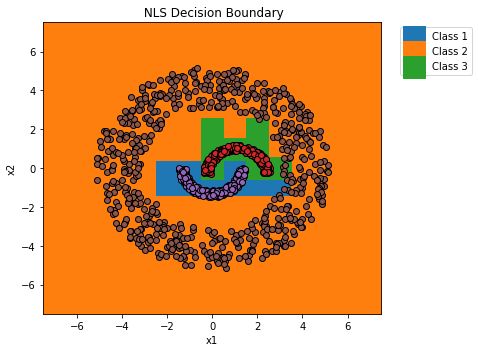

In [142]:

nls_c1x, nls_c2x, nls_c3x = [], [], []
nls_c1y, nls_c2y, nls_c3y = [], [], []

nls_y = nls_output

for i in range(len(nls_all_points)):
        
    if nls_y[i] == 1:
        nls_c1x.append(nls_all_points.iloc[i, 0])
        nls_c1y.append(nls_all_points.iloc[i, 1])
    elif nls_y[i] == 2:
        nls_c2x.append(nls_all_points.iloc[i, 0])
        nls_c2y.append(nls_all_points.iloc[i, 1])
    else:
        nls_c3x.append(nls_all_points.iloc[i, 0])
        nls_c3y.append(nls_all_points.iloc[i, 1])

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot()

# plt.figure(figsize=(8,5))    

# plt.scatter(nls_c2x, nls_c2y, marker='x', s=250)
# plt.scatter(nls_c3x, nls_c3y, marker='x', s=250)
# plt.scatter(nls_c1x, nls_c1y, marker='x', s=250)

plt.scatter(nls_c2x, nls_c2y, marker='s', s=450)
plt.scatter(nls_c3x, nls_c3y, marker='s', s=450)
plt.scatter(nls_c1x, nls_c1y, marker='s', s=450)


plt.legend(['Class 2','Class 3', 'Class 1'])
plt.legend(['Class 1','Class 2', 'Class 3'], bbox_to_anchor=(1.04,1), loc="upper left")


plt.scatter(nls_class1['c1'], nls_class1['c2'], edgecolors='black')
plt.scatter(nls_class2['c1'], nls_class2['c2'], edgecolors='black')
plt.scatter(nls_class3['c1'], nls_class3['c2'], edgecolors='black')

plt.title(" NLS Decision Boundary")
ax.set_xlabel("x1")

ax.set_ylabel("x2")
plt.tight_layout()
plt.savefig("/content/NLS_boundary.jpg")
plt.xlim(-7.5, 7.5)
plt.ylim(-7.5, 7.5)

plt.show()

In [85]:
y = nls_output

In [87]:
all_points

,0,1
0,-10,-17
1,-10,-16
2,-10,-15
3,-10,-14
4,-10,-13
...,...,...
1355,29,12
1356,29,13
1357,29,14
1358,29,15


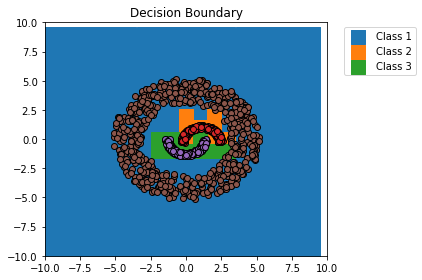

In [109]:
c1x, c2x, c3x = [], [], []
c1y, c2y, c3y = [], [], []

for i in range(len(nls_all_points)):
        
    if y[i] == 1:
        c1x.append(nls_all_points.iloc[i, 0])
        c1y.append(nls_all_points.iloc[i, 1])
    elif y[i] == 2:
        c2x.append(nls_all_points.iloc[i, 0])
        c2y.append(nls_all_points.iloc[i, 1])
    else:
        c3x.append(nls_all_points.iloc[i, 0])
        c3y.append(nls_all_points.iloc[i, 1])
    

plt.scatter(c3x, c3y, marker='s', s=190)
plt.scatter(c1x, c1y, marker='s', s=190)
plt.scatter(c2x, c2y, marker='s', s=190)




plt.legend(['Class 2','Class 3', 'Class 1'])
plt.legend(['Class 1','Class 2', 'Class 3'], bbox_to_anchor=(1.04,1), loc="upper left")


plt.scatter(nls_class1['c1'], nls_class1['c2'], edgecolors='black')
plt.scatter(nls_class2['c1'], nls_class2['c2'], edgecolors='black')
plt.scatter(nls_class3['c1'], nls_class3['c2'], edgecolors='black')

plt.title("Decision Boundary")
plt.tight_layout()
# plt.savefig("/Users/rajeshr/Desktop/fcnndecisionboundary.png")
plt.xlim(-10, 10)
plt.ylim(-10, 10)

ax.set_xlabel('x1')
ax.set_ylabel('x2')

plt.show()

# NLS Neuron Outputs

In [196]:
def get_plot_df(class_dataframe, weights_dict, layer_num,num_neurons):
  # for i in range(nls_class1.shape[0]):
  mod_ = FCNN()
  a_df = pd.DataFrame(columns =['x1','x2', 'act'])
  # for i in range(5):
  for i in range(class_dataframe.shape[0]):
    df_ = class_dataframe.iloc[i, :-1]
    # print(df_)
    x_n= np.hstack([np.ones((1)), df_])
    # 
    weighted_inps, layer_ops = mod_.fcnn_forward(x_n, weights_dict)
    # z = layer_ops[layer_num][1:].reshape(-1,1)
    z = layer_ops[layer_num].reshape(-1,1)
    # print(z)
    # 
    df_ = df_.to_numpy().reshape(1,-1)
    # print(x_n.shape)
    r_a = np.repeat(df_, repeats=num_neurons, axis=0)
    r_a = np.hstack((r_a, z))
    tmp_df = pd.DataFrame(r_a,columns=['x1', 'x2', 'act'])
    # a_df
    a_df = pd.concat([a_df,tmp_df])
  return a_df

In [157]:
nls_train_adf_1_1 = get_plot_df(nls_class1, nls_weights_dict, 64)#layer1_class1

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [158]:
nls_train_adf_1_2 = get_plot_df(nls_class2, nls_weights_dict, 64)#layer1_class2

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [159]:
nls_train_adf_1_3 = get_plot_df(nls_class3, nls_weights_dict, 64)#layer1_class3

<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [160]:
def get_df_for_nth_neuron(a_df, n=4, num_neurons=64):
  """
  a_df: class_wise df of [x1,x2,act]
  """
  df = a_df.iloc[n-1::num_neurons, :]
  return df

In [195]:
def plot_neuron_op(layer_num, neuron_num, df_cl1, df_cl2, df_cl3):
  from mpl_toolkits.mplot3d import Axes3D
  import matplotlib.pyplot as plt

  fig = plt.figure(figsize=(8,7))
  ax = fig.add_subplot(projection='3d')

  ax.scatter(df_cl1['x1'], df_cl1['x2'], df_cl1['act'], c='r', marker='o')
  ax.scatter(df_cl2['x1'], df_cl2['x2'], df_cl2['act'], c='g', marker='o')
  ax.scatter(df_cl3['x1'], df_cl3['x2'], df_cl3['act'], c='b', marker='o')
  plt.legend(['Class 1','Class 2','Class 3'], bbox_to_anchor=(1.04,1), loc="upper left")
  plt.title("Neuron " +str(neuron_num)+ " activations")
  # plt.xlabel("x1")
  # plt.ylabel("x2")
  # plt.zlabel("Neuron Activation")
  ax.set_xlabel("x1")

  ax.set_ylabel("x2")

  ax.set_zlabel("Neuron Activation")
  plt.savefig("/content/val_layer3/neuron_"+str(neuron_num)+".png")

  plt.show
  return

In [ ]:
for n in range(1, 65):
  plot_df_train_l1_cl1 = get_df_for_nth_neuron(nls_train_adf_1_1, n, num_neurons=64)
  plot_df_train_l1_cl2 = get_df_for_nth_neuron(nls_train_adf_1_2, n, num_neurons=64)
  plot_df_train_l1_cl3 = get_df_for_nth_neuron(nls_train_adf_1_3, n, num_neurons=64)

  plot_neuron_op(layer_num, n, plot_df_train_l1_cl1, plot_df_train_l1_cl2, plot_df_train_l1_cl3)

In [ ]:
!zip -r /content/layer2_train_nls.zip /content/pics_layer2_nls

In [179]:
from google.colab import files
files.download('/content/layer2_train_nls.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#nls layer 2 train

In [176]:
nls_train_adf_2_1 = get_plot_df(nls_class1, nls_weights_dict, 2, 64)#layer1_class1
nls_train_adf_2_2 = get_plot_df(nls_class2, nls_weights_dict, 2, 64)#layer1_class1
nls_train_adf_2_3 = get_plot_df(nls_class3, nls_weights_dict, 2, 64)#layer1_class1


<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [ ]:
for n in range(1, 65):
  plot_df_train_l2_cl1 = get_df_for_nth_neuron(nls_train_adf_2_1, n, num_neurons=64)#nls_train_adf_2_1:layer2 class1
  plot_df_train_l2_cl2 = get_df_for_nth_neuron(nls_train_adf_2_2, n, num_neurons=64)
  plot_df_train_l2_cl3 = get_df_for_nth_neuron(nls_train_adf_2_3, n, num_neurons=64)

  plot_neuron_op(layer_num, n, plot_df_train_l2_cl1, plot_df_train_l2_cl2, plot_df_train_l2_cl3)

#NLS output layer train

In [183]:
nls_train_adf_3_1 = get_plot_df(nls_class1, nls_weights_dict, 3, 3)#layer1_class1
nls_train_adf_3_2 = get_plot_df(nls_class2, nls_weights_dict, 3, 3)#layer1_class1
nls_train_adf_3_3 = get_plot_df(nls_class3, nls_weights_dict, 3, 3)#layer1_class1


<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


In [ ]:
for n in range(1, 4):
  plot_df_train_l3_cl1 = get_df_for_nth_neuron(nls_train_adf_3_1, n, num_neurons=3)#nls_train_adf_2_1:layer2 class1
  plot_df_train_l3_cl2 = get_df_for_nth_neuron(nls_train_adf_3_2, n, num_neurons=3)
  plot_df_train_l3_cl3 = get_df_for_nth_neuron(nls_train_adf_3_3, n, num_neurons=3)

  plot_neuron_op(layer_num, n, plot_df_train_l3_cl1, plot_df_train_l3_cl2, plot_df_train_l3_cl3)

# NLS validation layer 1

In [188]:
nls_val_adf_1_1 = get_plot_df(nls_class1_val, nls_weights_dict, 1, 64)#layer1_class1
nls_val_adf_1_2 = get_plot_df(nls_class2_val, nls_weights_dict, 1, 64)#layer1_class2
nls_val_adf_1_3 = get_plot_df(nls_class3_val, nls_weights_dict, 1, 64)#layer1_class3


<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


<ipython-input-187-dd7b7a8d8c9e>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(8,7))


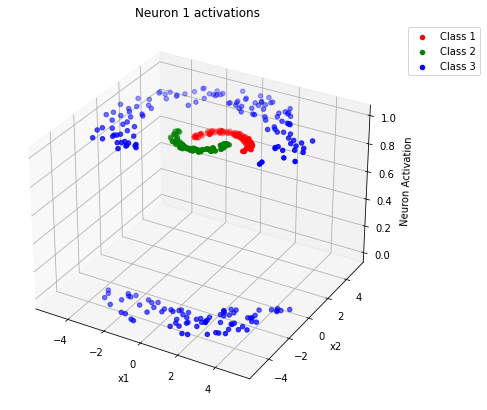

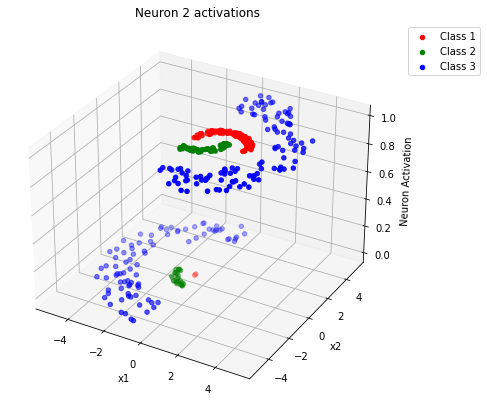

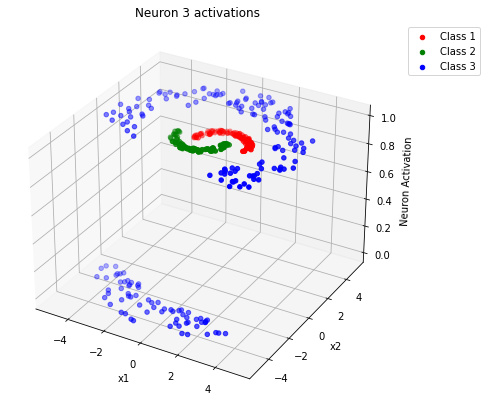

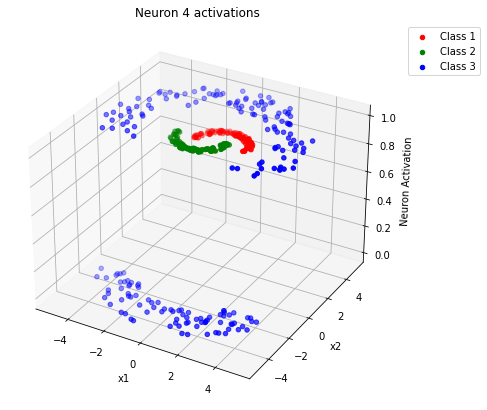

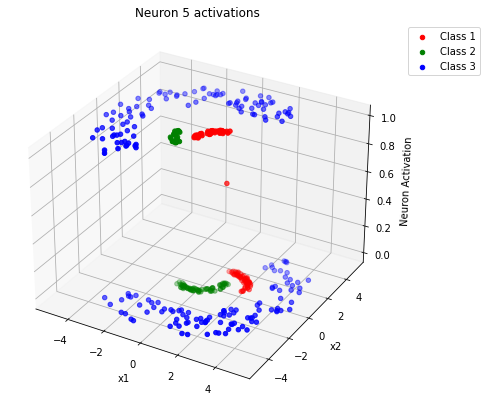

...

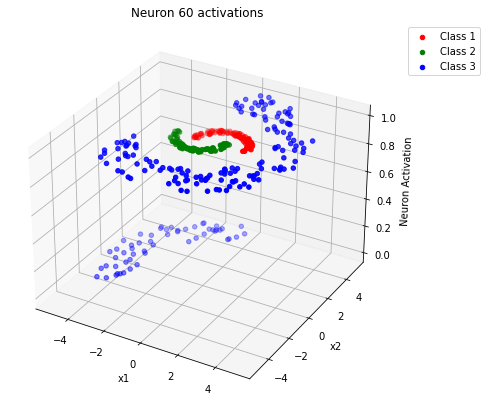

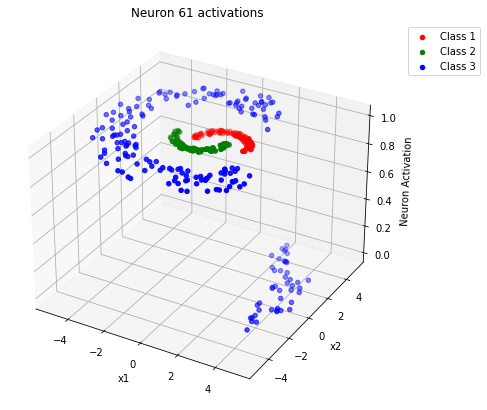

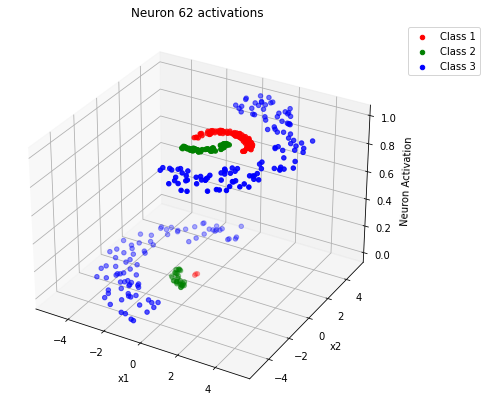

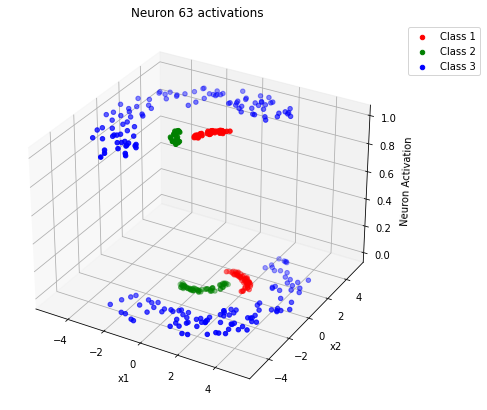

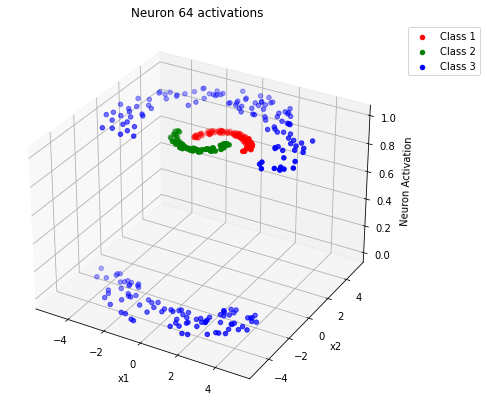

In [189]:
for n in range(1, 65):
  plot_df_val_l1_cl1 = get_df_for_nth_neuron(nls_val_adf_1_1, n, num_neurons=64)
  plot_df_val_l1_cl2 = get_df_for_nth_neuron(nls_val_adf_1_2, n, num_neurons=64)
  plot_df_val_l1_cl3 = get_df_for_nth_neuron(nls_val_adf_1_3, n, num_neurons=64)

  plot_neuron_op(layer_num, n, plot_df_val_l1_cl1, plot_df_val_l1_cl2, plot_df_val_l1_cl3)

In [ ]:
!zip -r /content/layer1_val_nls.zip /content/val_layer1
from google.colab import files
files.download('/content/layer1_val_nls.zip')

#NLS validation layer2

In [190]:
nls_val_adf_2_1 = get_plot_df(nls_class1_val, nls_weights_dict, 2, 64)#layer1_class1
nls_val_adf_2_2 = get_plot_df(nls_class2_val, nls_weights_dict, 2, 64)#layer1_class2
nls_val_adf_2_3 = get_plot_df(nls_class3_val, nls_weights_dict, 2, 64)#layer1_class3


<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


<ipython-input-192-5b0567b1a5e7>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(8,7))


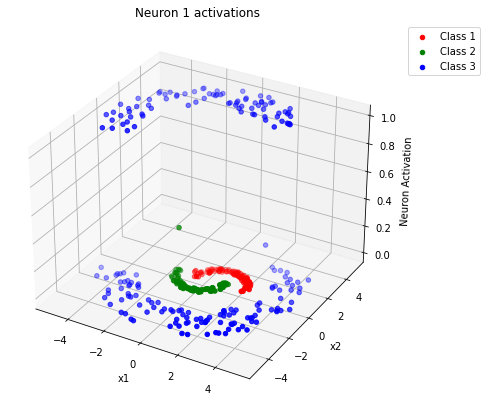

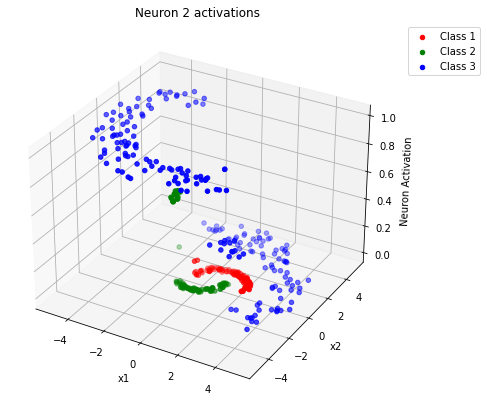

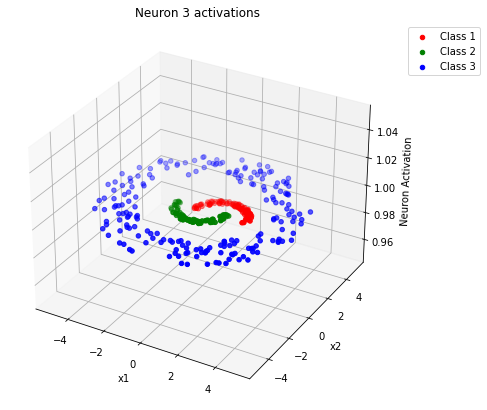

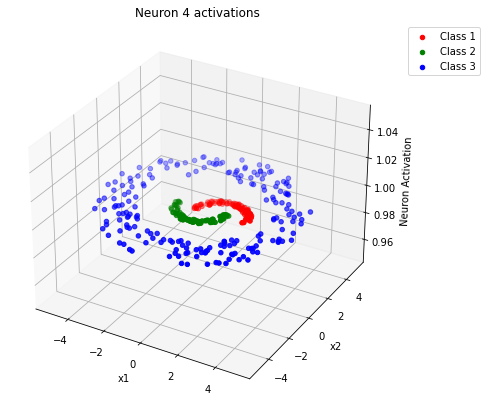

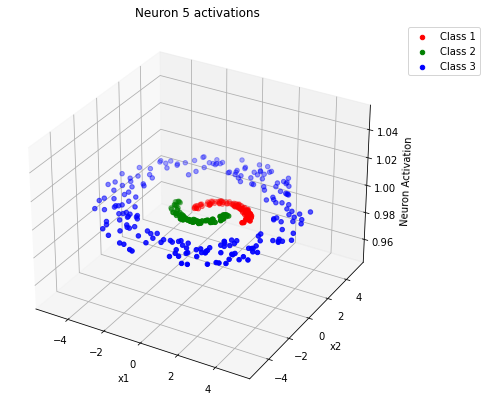

...

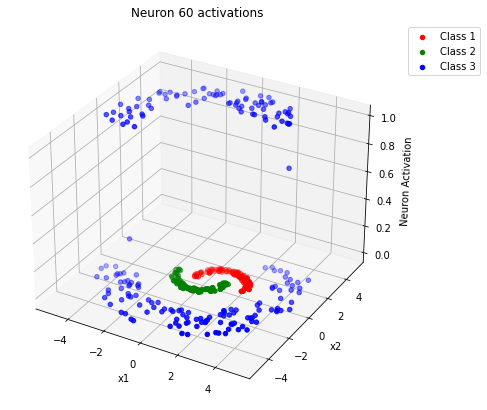

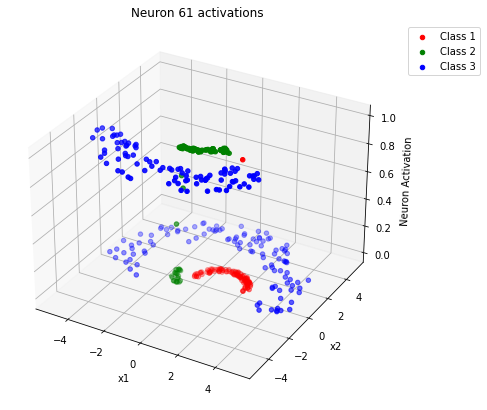

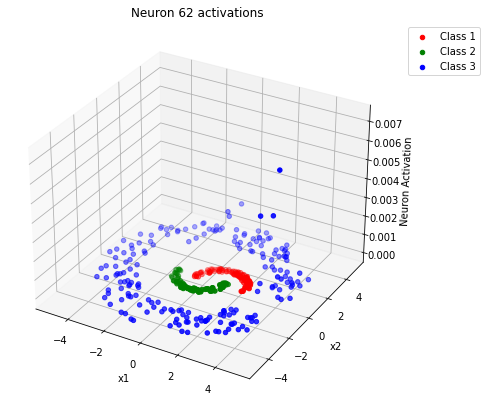

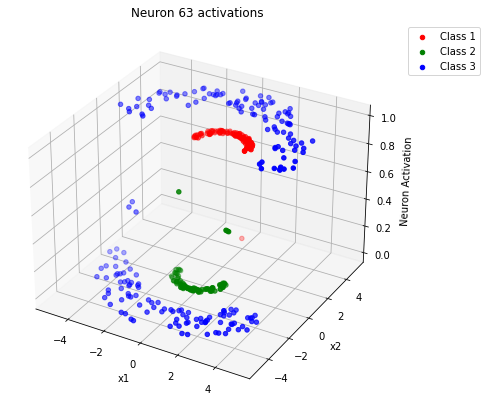

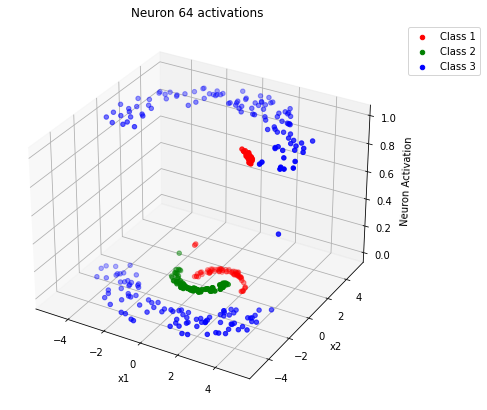

In [193]:
for n in range(1, 65):
  plot_df_val_l2_cl1 = get_df_for_nth_neuron(nls_val_adf_2_1, n, num_neurons=64)
  plot_df_val_l2_cl2 = get_df_for_nth_neuron(nls_val_adf_2_2, n, num_neurons=64)
  plot_df_val_l2_cl3 = get_df_for_nth_neuron(nls_val_adf_2_3, n, num_neurons=64)

  plot_neuron_op(layer_num, n, plot_df_val_l2_cl1, plot_df_val_l2_cl2, plot_df_val_l2_cl3)

In [ ]:
!zip -r /content/layer2_val_nls.zip /content/val_layer2
from google.colab import files
files.download('/content/layer2_val_nls.zip')

#NLS validation layer3

In [197]:
nls_val_adf_3_1 = get_plot_df(nls_class1_val, nls_weights_dict, 3, 3)#layer3_class1
nls_val_adf_3_2 = get_plot_df(nls_class2_val, nls_weights_dict, 3, 3)#layer3_class2
nls_val_adf_3_3 = get_plot_df(nls_class3_val, nls_weights_dict, 3, 3)#layer3_class3


<ipython-input-9-38bedbd6d0b6>:14: RuntimeWarning: overflow encountered in exp
  activation_value = 1/(1+np.exp(-a))


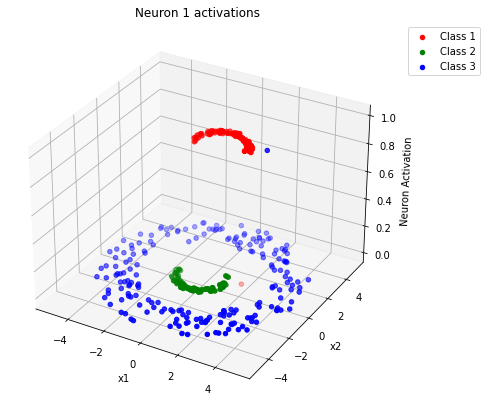

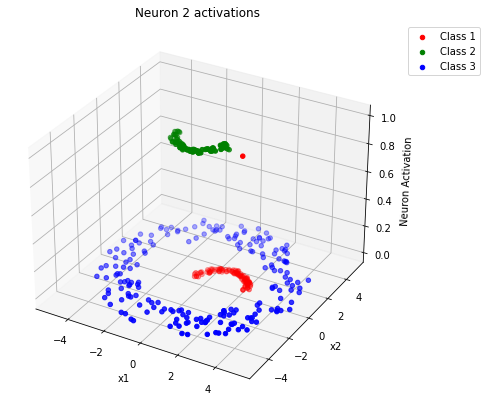

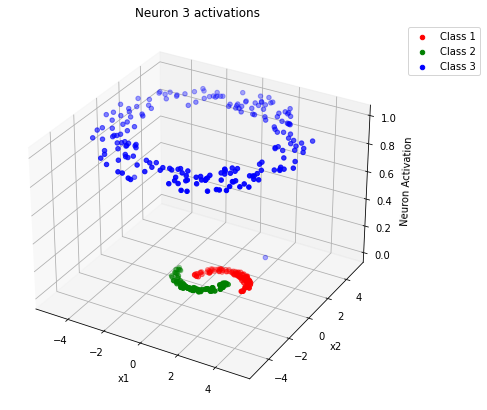

In [198]:
for n in range(1, 4):
  plot_df_val_l3_cl1 = get_df_for_nth_neuron(nls_val_adf_3_1, n, num_neurons=3)
  plot_df_val_l3_cl2 = get_df_for_nth_neuron(nls_val_adf_3_2, n, num_neurons=3)
  plot_df_val_l3_cl3 = get_df_for_nth_neuron(nls_val_adf_3_3, n, num_neurons=3)

  plot_neuron_op(layer_num, n, plot_df_val_l3_cl1, plot_df_val_l3_cl2, plot_df_val_l3_cl3)

In [199]:
!zip -r /content/layer3_val_nls.zip /content/val_layer3
from google.colab import files
files.download('/content/layer3_val_nls.zip')

  adding: content/val_layer3/ (stored 0%)
  adding: content/val_layer3/neuron_2.png (deflated 5%)
  adding: content/val_layer3/neuron_3.png (deflated 5%)
  adding: content/val_layer3/neuron_1.png (deflated 5%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#NLS test layer 1

#NLS test layer2

#NLS test layer3

In [164]:
for i in range(1,3):
  print(i)

1
2


In [ ]:
nls_class1

In [ ]:
nls_class1

In [ ]:
nls_classwise_data = {1: }

In [ ]:
nls_layerwise_df = {1: }

In [ ]:
n1df = get_df_for_nth_neuron(nls_train_adf_1, n=4, num_neurons=64)
n1dfc2 = get_df_for_nth_neuron(nls_train_adf_2, n=4, num_neurons=64)
n1dfc3 = get_df_for_nth_neuron(nls_train_adf_3, n=4, num_neurons=64)